<h1> Restaurant Revenue Regression
    
<h4> Data fields
    
* **Id** : Restaurant id. 
* **Open Date** : opening date for a restaurant
* **City** : City that the restaurant is in. Note that there are unicode in the names. 
* **City Group**: Type of the city. Big cities, or Other. 
* **Type**: Type of the restaurant. FC: Food Court, IL: Inline, DT: Drive Thru, MB: Mobile
* **P1, P2 - P37**: There are three categories of these obfuscated data. Demographic data are gathered from third party providers with GIS systems. These include population in any given area, age and gender distribution, development scales. Real estate data mainly relate to the m2 of the location, front facade of the location, car park availability. Commercial data mainly include the existence of points of interest including schools, banks, other QSR operators.
* **Revenue**: The revenue column indicates a (transformed) revenue of the restaurant in a given year and is the target of predictive analysis. Please note that the values are transformed so they don't mean real dollar values. 

<h1> 0. unzip the .csv dataset

In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

train_dir = '../input/restaurant-revenue-prediction/train.csv.zip'
test_dir = '../input/restaurant-revenue-prediction/test.csv.zip'

import zipfile
with zipfile.ZipFile(train_dir,"r") as z:
    z.extractall('.')

with zipfile.ZipFile(test_dir,"r") as z:
    z.extractall('.')

/kaggle/input/restaurant-revenue-prediction/train.csv.zip
/kaggle/input/restaurant-revenue-prediction/sampleSubmission.csv
/kaggle/input/restaurant-revenue-prediction/test.csv.zip


In [5]:
from datetime import datetime

<h1> 1. Load the Dataset

In [6]:
# load the train and test dataframe
train_df=pd.read_csv('./train.csv')
test_df=pd.read_csv('./test.csv')

# look at the information of the train_df
display(train_df.head())
display(train_df.info())

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,07/17/1999,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,02/14/2008,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,03/09/2013,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,02/02/2012,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,05/09/2009,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 43 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Id          137 non-null    int64  
 1   Open Date   137 non-null    object 
 2   City        137 non-null    object 
 3   City Group  137 non-null    object 
 4   Type        137 non-null    object 
 5   P1          137 non-null    int64  
 6   P2          137 non-null    float64
 7   P3          137 non-null    float64
 8   P4          137 non-null    float64
 9   P5          137 non-null    int64  
 10  P6          137 non-null    int64  
 11  P7          137 non-null    int64  
 12  P8          137 non-null    int64  
 13  P9          137 non-null    int64  
 14  P10         137 non-null    int64  
 15  P11         137 non-null    int64  
 16  P12         137 non-null    int64  
 17  P13         137 non-null    float64
 18  P14         137 non-null    int64  
 19  P15         137 non-null    i

None

<h1> 2. Pre-Process the Dataset

<h2> 2.1 convert some features data type
    
<li> convert some features into [datetime] datatypes
<li> convert some int/float to [str] datatypes
    

In [7]:
# select the columns convert to [datetime] object in Python
def time_feature_convert(df,time_features,time_format):
    df[time_features]=df[time_features].apply(
    pd.to_datetime,
    format=time_format)
    print(f'Feature Type Conversion Informatoin: {(df[time_features]).dtypes}\n')
    return df

# transfer the cols in train and test df     
time_feature_convert(df=train_df,
                     time_features=['Open Date'],
                     time_format='%m/%d/%Y')
time_feature_convert(df=test_df,
                     time_features=['Open Date'],
                     time_format='%m/%d/%Y')
pass

Feature Type Conversion Informatoin: Open Date    datetime64[ns]
dtype: object

Feature Type Conversion Informatoin: Open Date    datetime64[ns]
dtype: object



In [8]:
# select the columns convert to [str] object in Python
def str_feature_convert(df,str_features):
    df[str_features]=df[str_features].astype(str)
    print(f'Feature Type Conversion Informatoin: {(df[str_features]).dtypes}\n')
    return df

# transfer the cols in train and test df     
str_feature_convert(df=train_df,
                     str_features=['Id'])
str_feature_convert(df=test_df,
                     str_features=['Id'])
pass

Feature Type Conversion Informatoin: Id    object
dtype: object

Feature Type Conversion Informatoin: Id    object
dtype: object



In [9]:
# now check the df datatypes
display(train_df.info())
display(train_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 43 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Id          137 non-null    object        
 1   Open Date   137 non-null    datetime64[ns]
 2   City        137 non-null    object        
 3   City Group  137 non-null    object        
 4   Type        137 non-null    object        
 5   P1          137 non-null    int64         
 6   P2          137 non-null    float64       
 7   P3          137 non-null    float64       
 8   P4          137 non-null    float64       
 9   P5          137 non-null    int64         
 10  P6          137 non-null    int64         
 11  P7          137 non-null    int64         
 12  P8          137 non-null    int64         
 13  P9          137 non-null    int64         
 14  P10         137 non-null    int64         
 15  P11         137 non-null    int64         
 16  P12         137 non-null  

None

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,1999-07-17,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,2008-02-14,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,2013-03-09,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,2012-02-02,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,2009-05-09,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


<h2> 2.2 Drop some irrelevant features (such as ID)

In [10]:
# indicate the cols that need to be dropped
drop_features=['Id','Open Date']

# drop the selected cols
train_df.drop(drop_features,axis=1,inplace=True)
test_df.drop(drop_features,axis=1,inplace=True)

In [11]:
train_df

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,...,3.0,5,1,3,2,3,4,3,3,4316715.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,Trabzon,Other,FC,2,3.0,3.0,5.0,4,2,4,...,3.0,0,0,0,0,0,0,0,0,5787594.0
133,İzmir,Big Cities,FC,4,5.0,4.0,4.0,2,3,5,...,3.0,0,0,0,0,0,0,0,0,9262754.0
134,Kayseri,Other,FC,3,4.0,4.0,4.0,2,3,5,...,3.0,0,0,0,0,0,0,0,0,2544857.0
135,İstanbul,Big Cities,FC,4,5.0,4.0,5.0,2,2,5,...,3.0,0,0,0,0,0,0,0,0,7217634.0


<h1> 3. EDA

In [12]:
pip install dataprep

     |████████████████████████████████| 1.8 MB 4.4 MB/s eta 0:00:01
     |████████████████████████████████| 848 kB 63.8 MB/s eta 0:00:01
     |████████████████████████████████| 63 kB 2.1 MB/s  eta 0:00:01
     |████████████████████████████████| 1.5 MB 43.1 MB/s eta 0:00:01
     |████████████████████████████████| 125 kB 52.4 MB/s eta 0:00:01
     |████████████████████████████████| 719 kB 60.1 MB/s eta 0:00:01
     |████████████████████████████████| 49 kB 4.7 MB/s  eta 0:00:01
     |████████████████████████████████| 743 kB 50.9 MB/s eta 0:00:01
  Created wheel for metaphone: filename=Metaphone-0.6-py3-none-any.whl size=13919 sha256=e099ec84732a41e1e974f56d208d0f58deca7f2086e836d22f32964881cbcda7
  Stored in directory: /root/.cache/pip/wheels/1d/a8/cb/6f8902aa5457bd71344e00665c230e9c45255b3f57f2194a0f
Successfully built metaphone
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 3.0.1
    Uninstalling Jinja2-3.0.1:
      Successfully uninstalled Jinja2-3.0.1
  Attempt

In [13]:
from dataprep.datasets import get_dataset_names
from dataprep.datasets import load_dataset
from dataprep.eda import create_report,plot,plot_missing
import scipy.stats as stats

<h2> 3.1 Overall Statistics

In [14]:
# function for overall statistical report
def overall_stat(df):
    # display the overall stat report
    display(plot(df, display=['Stats', 'Insights']))
    # display(df.info())

    # store and display the numerical and nonn-numerical cols in df
    num_cols=list(df.select_dtypes(include=['number']).columns)
    non_num_cols=list((set(df.columns)-set(num_cols)))

    print(f'Num cols = {num_cols}')
    print(f'Non-num cols = {non_num_cols}')

  0%|          | 0/1195 [00:00<?, ?it/s]


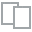
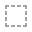
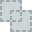
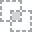
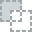
...
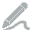
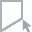
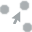
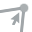
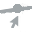

Num cols = ['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21', 'P22', 'P23', 'P24', 'P25', 'P26', 'P27', 'P28', 'P29', 'P30', 'P31', 'P32', 'P33', 'P34', 'P35', 'P36', 'P37', 'revenue']
Non-num cols = ['City', 'Type', 'City Group']


In [15]:
# display the overall stats
overall_stat(train_df)

**As can be seen above, for train_df:**
<li> 137 rows
<li> no missing value
<li> 41 features, 1 target (numerical)

<h2> 3.2 Univariate Analysis

<h3> 3.2.1 Numerical Feature Univariate Analysis

![](https://upload.wikimedia.org/wikipedia/commons/thumb/c/cc/Relationship_between_mean_and_median_under_different_skewness.png/434px-Relationship_between_mean_and_median_under_different_skewness.png)

In [16]:
# define the interest feature you want to explore
inter_features='revenue'

# define the function for univariate analysis
def num_uni_analysis(df,inter_features):
    display(plot(df,inter_features,display=['Stats','KDE Plot','Normal Q-Q Plot','Box Plot']))
    skewness=df[inter_features].skew()
    kurtosis=df[inter_features].kurtosis()
    print(f'-The Skewness = {skewness}')
    if abs(skewness)<1:
        print(f'The [{inter_features}] distribution is nearly normal')
    elif skewness>1:
        print(f'The [{inter_features}] distribution is right skewed ')
    else:
        print(f'The [{inter_features}] distribution is left skewed ')
    print(f'-The Kurtosis = {kurtosis}')

/opt/conda/lib/python3.7/site-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)


  0%|          | 0/83 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)



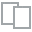
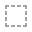
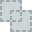
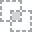
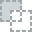
...
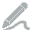
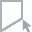
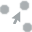
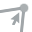
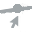

-The Skewness = 2.793478695162504
The [revenue] distribution is right skewed 
-The Kurtosis = 12.055176638707394


In [17]:
# display the univariate analysis result for feature [revenue]
num_uni_analysis(train_df,inter_features)

<h3> 3.2.2 Categorical Feature Univaraite Analysis

In [18]:
# define the function for univariate analysis
def cat_uni_analysis(df,inter_features):
    print(f'The Non-Numerical Column You Choose is: [{inter_features}]\n')
    display(plot(df,inter_features,display=['Stats','Pie Chart','Value Table']))

The Non-Numerical Column You Choose is: [Type]



  0%|          | 0/43 [00:00<?, ?it/s]


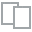
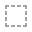
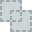
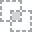
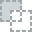
...
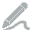
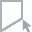
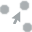
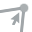
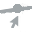

The Non-Numerical Column You Choose is: [City]



  0%|          | 0/43 [00:00<?, ?it/s]


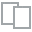
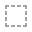
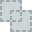
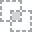
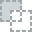
...
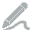
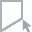
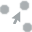
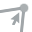
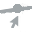

The Non-Numerical Column You Choose is: [City Group]



  0%|          | 0/43 [00:00<?, ?it/s]


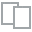
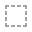
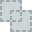
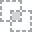
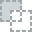
...
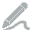
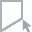
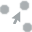
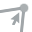
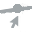

In [19]:
# display the univariate categorical analysis result
cat_uni_analysis(train_df,inter_features='Type')
cat_uni_analysis(train_df,inter_features='City')
cat_uni_analysis(train_df,inter_features='City Group')

<h2> 3.3 Bivariate Analysis

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

<h3> 3.3.1 Overall num-num relationship (corr heatmap)

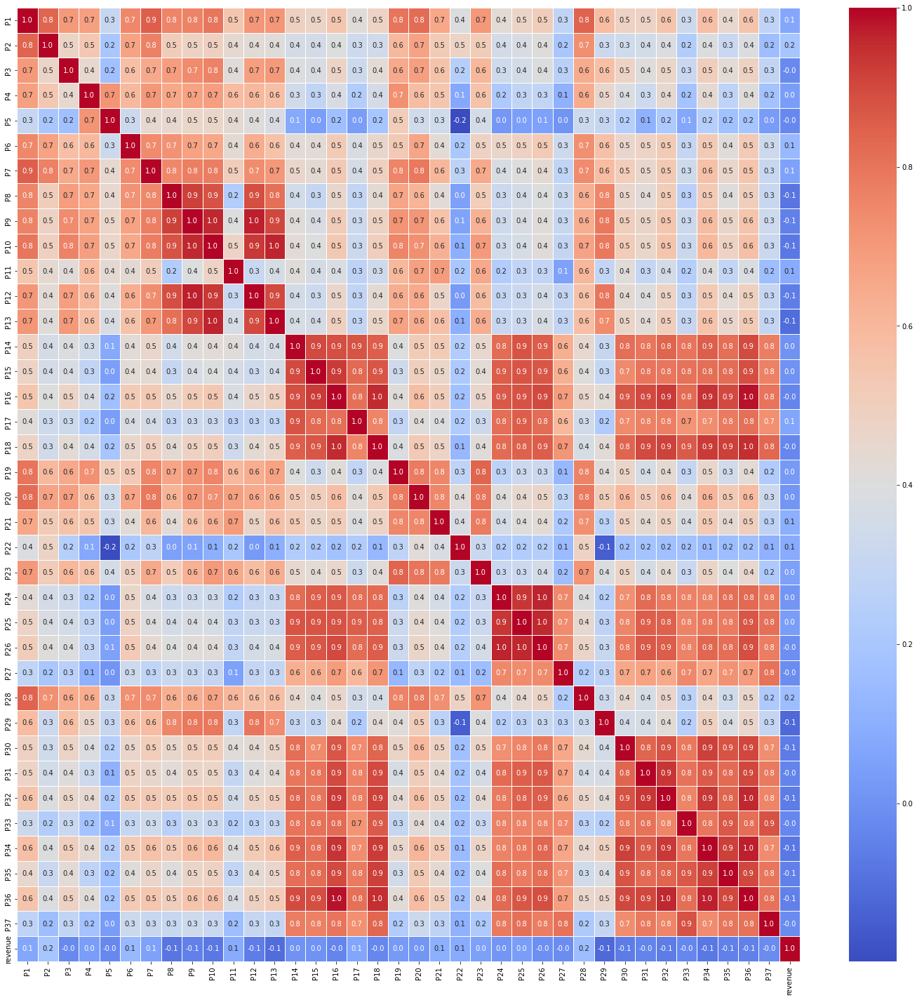

In [21]:
# overall num-num relationship: correlation heatmap
def heatmap(df,figsize):
    fig, axs=plt.subplots(figsize=figsize)
    sns.heatmap(df.corr(),annot=True, linewidths=.7,cmap='coolwarm',fmt='.1f',ax=axs)
    
# display the overall correlation heatmap
heatmap(df=train_df,figsize=(25,25))

<h3> 3.3.2 Categorical - Numerical relationship (1 vs 1)

In [22]:
pip install scikit-posthocs

     |████████████████████████████████| 43 kB 778 kB/s eta 0:00:011
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for scikit-posthocs: filename=scikit_posthocs-0.6.7-py3-none-any.whl size=37902 sha256=122718fe144aa72a425431eba69fdc545129eca066e67c29b03b83aeb8aeb7cd
  Stored in directory: /root/.cache/pip/wheels/b8/21/e6/f39794d4a6ee3d3cc5146ca80b5cd949452ad4a8fde9f6b9fc
Successfully built scikit-posthocs
Note: you may need to restart the kernel to use updated packages.


In [23]:
# this is for the Kruskal test used for categorical-numerical relationship
import scikit_posthocs as sp 

In [24]:
# categoircal-numerical relationship (cat_feature - target)

def cat_num_relationship(df,cat_col,num_col):
    # visualization
    print(f'[{cat_col}] --- [{num_col}] relationship')
    display(plot(df,num_col,cat_col))
    
    # hypothesis testing for catgorical-numerical relationship (Kruskal test)
    pc = sp.posthoc_conover(df, val_col=num_col, group_col=cat_col,p_adjust = 'holm')
    # visualization of the heatmap
    heatmap_args = {'linewidths': 0.25, 'linecolor': '0.5', 'square': True, 'cbar_ax_bbox': [0.80, 0.35, 0.04, 0.3]}

    # plot
    fig, ax = plt.subplots(ncols=1)
    fig.suptitle('Significance Plot')
    sp.sign_plot(pc,**heatmap_args,ax=ax) 
    fig.show()


[City] --- [revenue] relationship


  0%|          | 0/38 [00:00<?, ?it/s]


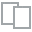
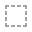
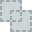
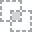
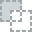
...
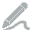
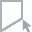
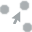
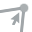
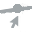

[Type] --- [revenue] relationship


  0%|          | 0/38 [00:00<?, ?it/s]


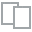
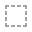
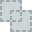
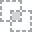
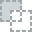
...
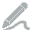
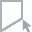
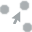
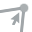
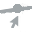

[City Group] --- [revenue] relationship


  0%|          | 0/38 [00:00<?, ?it/s]


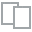
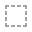
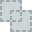
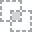
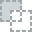
...
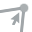
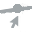

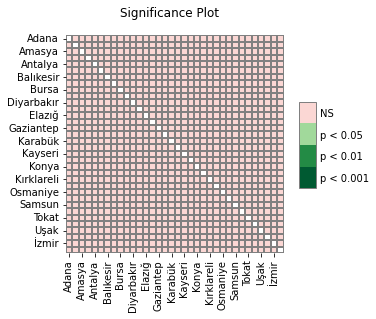

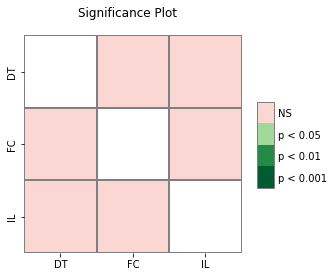

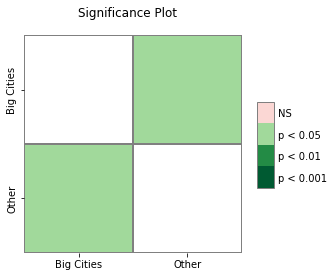

In [25]:
cat_num_relationship(df=train_df,
                    cat_col='City',
                    num_col='revenue')

cat_num_relationship(df=train_df,
                    cat_col='Type',
                    num_col='revenue')

cat_num_relationship(df=train_df,
                    cat_col='City Group',
                    num_col='revenue')

<h3> 3.3.3 Categorical-Categorical Relationship (1 vs 1)

In [26]:
from scipy.stats import chi2_contingency

In [27]:
# categoircal-categorical relationship

def cat_cat_relationship(df,cat_col_1,cat_col_2):
    # visualization
    plot(df,cat_col_1,
         cat_col_2,
         display=['Stacked Bar Chart','Heat Map'])
    
    # Chi-square test
    
    # 1st step convert the data into a contingency table with frequencies
    chi_contigency=pd.crosstab(df[cat_col_1],df[cat_col_2])
    print(f'Selected cols [{cat_col_1}] and [{cat_col_2}]')
    print('chi2-contingency table')
    display(chi_contigency)
    
    # 2nd step: Chi-square test of independence.
    c, p, dof, expected = chi2_contingency(chi_contigency)
    if p<0.05:
      print('Reject Null Hypothesis')
      print(f'The:\n [{cat_col_1}],[{cat_col_2}] are not independent\n')
    else:
      print('Fail to Reject Null Hypothesis')
      print(f'The:\n [{cat_col_1}],[{cat_col_2}] are independent\n') 
    print(f'The P-value = {p}')


In [28]:
# display the result
cat_cat_relationship(df=train_df,
                    cat_col_1='City Group',
                    cat_col_2='Type')


Selected cols [City Group] and [Type]
chi2-contingency table


Type,DT,FC,IL
City Group,,,
Big Cities,1,39,38
Other,0,37,22


Fail to Reject Null Hypothesis
The:
 [City Group],[Type] are independent

The P-value = 0.2545007604128446


<h1> 4. Label Encoding

In [29]:
from sklearn import preprocessing

In [30]:
train_df.head()

,City,City Group,Type,P1,P2,P3,P4,P5,P6,P7,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,2,5,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,2,5,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,3,5,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,Tokat,Other,IL,6,4.5,6.0,6.0,4,4,10,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,2,5,...,3.0,5,1,3,2,3,4,3,3,4316715.0


In [31]:
# define the function for label or one-hot encoding
def label_encode_transform(df,cols):
    cols=cols
    le = preprocessing.LabelEncoder()
    df[cols]=df[cols].apply(le.fit_transform)
    return df
    
def onehot_encode_transform(df,cols):
    cols=cols
    df=pd.get_dummies(df,columns=cols)
    return df

In [32]:
train_df_encode=label_encode_transform(df=train_df,
                        cols=['City'])
train_df_encode=onehot_encode_transform(df=train_df_encode,
                        cols=['City Group','Type'])

test_df_encode=label_encode_transform(df=test_df,
                        cols=['City'])
test_df_encode=onehot_encode_transform(df=test_df_encode,
                        cols=['City Group','Type'])

In [33]:
train_df_encode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 44 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   City                   137 non-null    int64  
 1   P1                     137 non-null    int64  
 2   P2                     137 non-null    float64
 3   P3                     137 non-null    float64
 4   P4                     137 non-null    float64
 5   P5                     137 non-null    int64  
 6   P6                     137 non-null    int64  
 7   P7                     137 non-null    int64  
 8   P8                     137 non-null    int64  
 9   P9                     137 non-null    int64  
 10  P10                    137 non-null    int64  
 11  P11                    137 non-null    int64  
 12  P12                    137 non-null    int64  
 13  P13                    137 non-null    float64
 14  P14                    137 non-null    int64  
 15  P15   

<h1> 5. Feature Selection

In [34]:
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso
from sklearn.feature_selection import RFECV
from sklearn.metrics import mean_squared_error, roc_auc_score

In [35]:
# seperate the source and the target variables
feature_cols = [x for x in train_df_encode.columns if x != 'revenue']
X_train = train_df_encode[feature_cols]
y_train = train_df_encode['revenue']

X_test  = test_df_encode[feature_cols]


In [36]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

X_train_scaled= scaler.fit_transform(X_train)
X_test_scaled = scaler.transform (X_test)

In [62]:
model= Lasso()
feature_selector = RFECV(model,
                         scoring='neg_mean_squared_error',
                         cv=3)
feature_selector.fit(X_train_scaled,y_train)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119929837697320.0, tolerance: 54339207999.97658
  positive)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119929837697320.6, tolerance: 54339207999.97658
  positive)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119929993682708.3, tolerance: 54339207999.97658
  positive)
/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119981303606

RFECV(cv=3, estimator=Lasso(), scoring='neg_mean_squared_error')

In [64]:
feature_selector.n_features_

3

In [100]:
# length check
len(feature_selector.support_)==len(X_train.columns)

# store the selected features
select_feature=pd.DataFrame(
    {'tf':feature_selector.support_,
    'feature':X_train.columns})

selected_feature=list(select_feature.loc[select_feature['tf']==True]['feature'])
feature_coef=feature_selector.estimator_.coef_

Selected features are: ['City', 'P25', 'P26']


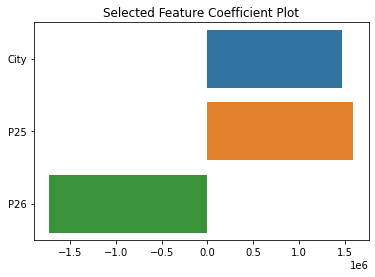

In [107]:
# visualize the selected feature and coefficient
ax=sns.barplot(y=selected_feature,x=feature_coef)
ax.set_title('Selected Feature Coefficient Plot')
print(f'Selected features are: {selected_feature}')

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:>

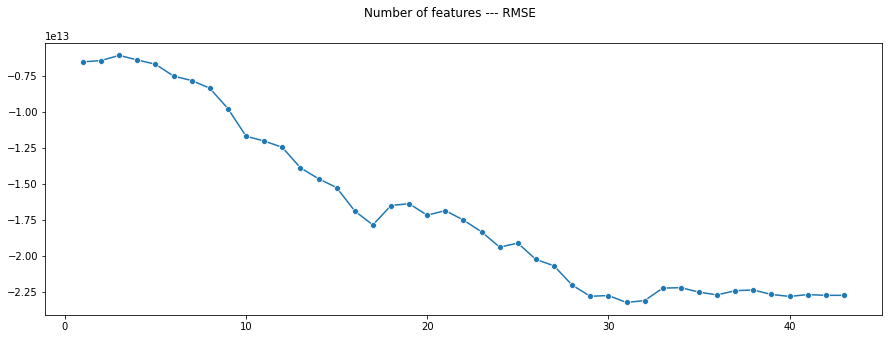

In [79]:
# Visualization
fig,axs=plt.subplots(ncols=1,figsize=(15,5))
fig.suptitle('Number of features --- RMSE')
sns.lineplot(range(1,len(feature_selector.grid_scores_)+1),
             feature_selector.grid_scores_,
             marker='o',
             ax=axs)


<H1> 6. Modelling

* Regularization method (Lasso, Ridge, Elastic Net)
* Tree based model (XGBoost etc)

In [154]:
# select the features from the dataset (3 features)
X_train_fs=X_train[selected_feature]
X_test_fs=X_test[selected_feature]

X_train_fs_scaled= scaler.fit_transform(X_train_fs)
X_test_fs_scaled = scaler.transform (X_test_fs)

In [113]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [114]:
pip install lightgbm

Note: you may need to restart the kernel to use updated packages.


In [128]:
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ElasticNetCV
import lightgbm as lgb
import xgboost as xgb

from sklearn.metrics import mean_squared_error

In [135]:
cv=3

# fit the Models
lassoCV=LassoCV(cv=cv).fit(X_train_fs_scaled,y_train)
ridgeCV=RidgeCV(cv=cv).fit(X_train_fs_scaled,y_train)
elasticnetCV=ElasticNetCV(cv=cv).fit(X_train_fs_scaled,y_train)
lightgbm=lgb.LGBMRegressor().fit(X_train_fs_scaled,y_train)
xgboost=xgb.XGBRegressor().fit(X_train_fs_scaled,y_train)

# generate the prediction for train dataset
lasso_train_pred=lassoCV.predict(X_train_fs_scaled)
ridge_train_pred=ridgeCV.predict(X_train_fs_scaled)
elasticnet_train_pred=elasticnetCV.predict(X_train_fs_scaled)
lgbm_train_pred=lightgbm.predict(X_train_fs_scaled)
xgb_train_pred=xgboost.predict(X_train_fs_scaled)

# generate RMSE for each models
lasso_RMSE= np.sqrt(mean_squared_error(y_train, lasso_train_pred))
ridge_RMSE= np.sqrt(mean_squared_error(y_train, ridge_train_pred))
elasticnet_RMSE= np.sqrt(mean_squared_error(y_train, elasticnet_train_pred))
lgbm_RMSE= np.sqrt(mean_squared_error(y_train, lgbm_train_pred))
xgb_RMSE= np.sqrt(mean_squared_error(y_train, xgb_train_pred))

 lasso=2426953.208520534 
 ridge = 2426181.2938082675
 Elastic_Net = 2566505.381339019
 LGBM = 2340916.3182369666
 XGBoost= 2099485.5223065442



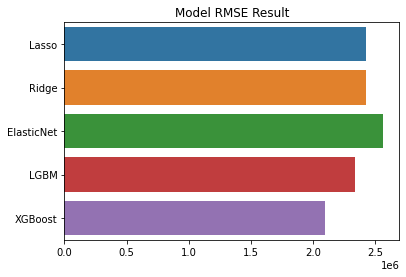

In [153]:
model_list=['Lasso','Ridge','ElasticNet','LGBM','XGBoost']
rmse_list=[lasso_RMSE,ridge_RMSE,elasticnet_RMSE,lgbm_RMSE,xgb_RMSE]

# plot the RMSE for each model
ax=sns.barplot(y=model_list,x=rmse_list)
ax.set_title('Model RMSE Result')

# print the result RMSE number
print(f' lasso={lasso_RMSE} \n ridge = {ridge_RMSE}\n Elastic_Net = {elasticnet_RMSE}\n LGBM = {lgbm_RMSE}\n XGBoost= {xgb_RMSE}\n')

**Therefore here i choose the XGBoost as the final model for prediction**

In [157]:
# generate prediction for test dataset
xgb_test_pred=xgboost.predict(X_test_fs_scaled)

In [161]:
# store the result
submission_df=pd.DataFrame(
{'Id':test_df.index,
'Prediction':xgb_test_pred}
)

In [165]:
submission_df.to_csv('submission_dcx.csv',index=False)